In [2]:
try:
    import numpy as np
    import pandas as pd
    
except:
    !pip install numpy
    !pip install pandas
    
    import numpy as np
    import pandas as pd

In [3]:
credit_card_df = pd.read_csv("card_transdata.csv")

# Rename features for readability
credit_card_df = credit_card_df.rename(columns={"distance_from_home":"Distance From Home",
                                                "distance_from_last_transaction":"Distance From Last Transaction",
                                                "ratio_to_median_purchase_price":"Ratio to Median Purchase Price",
                                                "repeat_retailer":"Repeat Retailer",
                                                "used_chip":"Used Chip",
                                                "used_pin_number":"Used Pin Number", 
                                                "online_order": "Online Order", 
                                                "fraud":"Fraud"})

credit_card_df.head(10)

,Distance From Home,Distance From Last Transaction,Ratio to Median Purchase Price,Repeat Retailer,Used Chip,Used Pin Number,Online Order,Fraud
0,57.877857,0.311140,1.945940,1.0,1.0,0.0,0.0,0.0
1,10.829943,0.175592,1.294219,1.0,0.0,0.0,0.0,0.0
2,5.091079,0.805153,0.427715,1.0,0.0,0.0,1.0,0.0
3,2.247564,5.600044,0.362663,1.0,1.0,0.0,1.0,0.0
4,44.190936,0.566486,2.222767,1.0,1.0,0.0,1.0,0.0
5,5.586408,13.261073,0.064768,1.0,0.0,0.0,0.0,0.0
6,3.724019,0.956838,0.278465,1.0,0.0,0.0,1.0,0.0
7,4.848247,0.320735,1.273050,1.0,0.0,1.0,0.0,0.0
8,0.876632,2.503609,1.516999,0.0,0.0,0.0,0.0,0.0
9,8.839047,2.970512,2.361683,1.0,0.0,0.0,1.0,0.0


In [5]:
X = credit_card_df.loc[:, ~credit_card_df.columns.isin(["Fraud"])]    # Select all rows and remove the column "fraud"
y = credit_card_df.loc[:, "Fraud"]   # Select all rows and the column "fraud"

In [6]:
try:
    from sklearn.model_selection import train_test_split

    # Oversampling and undersampling
    from imblearn.over_sampling import RandomOverSampler, SMOTE
    from imblearn.under_sampling import RandomUnderSampler, NearMiss
    from collections import Counter
    
except:
    !pip install sklearn
    !pip install -U imbalanced-learn
    !pip install collections
    
    from sklearn.model_selection import train_test_split
    from imblearn.over_sampling import RandomOverSampler, SMOTE
    from imblearn.under_sampling import RandomUnderSampler, NearMiss
    from collections import Counter

### Baseline (imbalanced) data

In [8]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

print("The number of training data record is:", X_train.shape[0])    # Return number of rows/records
print("The number of test data record is:", X_test.shape[0])
print("The training dataset has", str(Counter(y_train)[0]), "non-fraudulent transactions (majority class) and", 
      str(Counter(y_train)[1]), "fraudulent transactions (minority class).")


The number of training data record is: 700000
The number of test data record is: 300000
The training dataset has 638690 non-fraudulent transactions (majority class) and 61310 fraudulent transactions (minority class).


1). `X_train` - or **training features**, this includes all the features (i.e., the independent variables) that are used to train/fit the model. For this dataset, the features are the `Distance From Home`, `Distance From Last Transaction`, ..., `Online Order`, columns (since we've excluded the `Fraud` column)

2). `X_test` - or **testing features**, they are the same features as above of the remaining 30% of the dataset that are used in the testing phase. The model will use them to make predictions, thereby testing the accuracy of the model.

3). `y_train` - or **training labels**, this include the category labels (i.e., the dependent variable) which needs to be predicted by this model while training/fitting it. For this dataset, the label is the `Fraud` column.

4). `y_test` - or **testing labels**, this is the same label as above of the remaining 30% of the dataset that are used in the testing phase. These labels will be used to test the accuracy between actual and predicted categories.

5). `test_size` - we specified the `test_size = 0.3`, meaning 70% of the dataset's observations are used to train/fit the model and rest 30% will be used to test the model.

6). `random_state` - acts as a seed number, ensuring we have the same train test split every time.

### Undersampling

#### Random undersampling

In [9]:
# Randomly under sample the majority class
rus = RandomUnderSampler(random_state = 0)
X_train_rus, y_train_rus = rus.fit_resample(X_train, y_train)

# Check the number of records after undersampling
print("Number of fradulent transactions:", str(Counter(y_train_rus)[1]))
print("Number of non-fradulent transactions:", str(Counter(y_train_rus)[0]))

Number of fradulent transactions: 61310
Number of non-fradulent transactions: 61310


#### NearMiss undersampling

In [10]:
# Under sample the majority class
nearmiss = NearMiss(version = 3)  # There're 3 versions. We're using version 3
X_train_nearmiss, y_train_nearmiss = nearmiss.fit_resample(X_train, y_train)

# Check the number of records after undersampling
print("Number of fradulent transactions:", str(Counter(y_train_nearmiss)[1]))
print("Number of non-fradulent transactions:", str(Counter(y_train_nearmiss)[0]))

Number of fradulent transactions: 61310
Number of non-fradulent transactions: 43349


D:\Ky\Software\Anaconda (Installer)\lib\site-packages\imblearn\under_sampling\_prototype_selection\_nearmiss.py:203: UserWarning: The number of the samples to be selected is larger than the number of samples available. The balancing ratio cannot be ensure and all samples will be returned.
  warnings.warn(


**Note**: A potential explanation for the imbalanced class observations could be that the first step of the algorithm already performs an intense undersampling, leaving a number of observations to be undersampled in the second step that is already lower than the number specified in the dictionary. As a consequence, the algortithm only seems to work if the number of desired samples is very low in comparison to the existing samples.

### Oversampling

#### Random oversampling

In [11]:
# Randomly over sample the majority class
ros = RandomOverSampler(random_state = 0)
X_train_ros, y_train_ros = ros.fit_resample(X_train, y_train)

# Check the number of records after undersampling
print("Number of fradulent transactions:", str(Counter(y_train_ros)[1]))
print("Number of non-fradulent transactions:", str(Counter(y_train_ros)[0]))

Number of fradulent transactions: 638690
Number of non-fradulent transactions: 638690


#### SMOTE (Synthetic Minority Oversampling Technique) oversampling 

In [12]:
# Randomly under sample the majority class
smote = SMOTE(random_state = 0)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Check the number of records after undersampling
print("Number of fradulent transactions:", str(Counter(y_train_smote)[1]))
print("Number of non-fradulent transactions:", str(Counter(y_train_smote)[0]))

Number of fradulent transactions: 638690
Number of non-fradulent transactions: 638690


# Random Forest Classifier

In [13]:
try:
    from sklearn.ensemble import RandomForestClassifier
    from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
    from statistics import mean
    import matplotlib.pyplot as plt
    import seaborn as sns
    
except:
    !pip instal sklearn
    !pip install statistics
    !pip install matplotlib
    !pip install seaborn
    
    from sklearn.ensemble import RandomForestClassifier
    from statistics import mean
    from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
    import matplotlib.pyplot as plt
    import seaborn as sns

### Information and visualization functions

#### Confidence class

In [14]:
def confidence_class(predicted_probability_rf_sampling):
    confidence_class0 = predicted_probability_rf_sampling[:,0]  # First column is probability for non-fradulent class
    confidence_class1 = predicted_probability_rf_sampling[:,1]  # Second column is probability fradulent class
    
    return confidence_class0, confidence_class1

#### Model metrics

In [15]:
def model_metrics(rf_sampling_accuracy_score, predicted_probability_rf_sampling, predicted_rf_sampling):
    confidence_class0, confidence_class1 = confidence_class(predicted_probability_rf_sampling)
    
    adjusted_confidence_class0 = [1-prob if prob < 0.5 else prob for prob in confidence_class0]
    adjusted_confidence_class1 = [1-prob if prob < 0.5 else prob for prob in confidence_class1]

    print("The accuracy score for Random Under Sampling is", rf_sampling_accuracy_score)

    # Notice the score for each class is the same 
    print("The average confidence score of predicting class 0 - the non-fraudulent transactions - is", mean(adjusted_confidence_class0))
    print("The average confidence score of predicting class 1 - the fraudulent transactions - is", mean(adjusted_confidence_class1))
    print(classification_report(y_test, predicted_rf_sampling))

#### Plot confidence score historgram

In [16]:
def plot_confidence_score_histogram(predicted_probability_rf_sampling):
    confidence_class0, confidence_class1 = confidence_class(predicted_probability_rf_sampling)
    
    fig, ax = plt.subplots(1, 2, figsize = (16, 10))


    # Plot histogram for class 0 probability score
    class0_hist = sns.histplot(confidence_class0,
                               alpha = 0.4,
                               color = "green",
                               edgecolor = "white",
                               binwidth = 0.025,
                               ax = ax[0])

    # Set axis labels and title
    class0_hist.set(xlabel = "Probability score", 
                    ylabel = "Number of prediction",
                    title = "Class 0 probability score")


    # Plot histogram for class 1 probability score
    class1_hist = sns.histplot(confidence_class1,
                               alpha = 0.4,
                               color = "navy",
                               edgecolor = "white",
                               binwidth = 0.025,
                               ax = ax[1])

    # Set axis labels and title
    class1_hist.set(xlabel = "Probability score", 
                    ylabel = "Number of prediction",
                    title = "Class 1 probability score")


    fig.suptitle("Distribution of probability score for class 0 and 1")  # Main title
    plt.tight_layout()
    plt.show();

#### Plot confusion matrix

In [17]:
def plot_confusion_matrix(y_test, predict_rf_sampling):
    fig, axs = plt.subplots(1, 3, figsize = (20, 5))   # Don't set x = y for figsize since legend can affect plot

    # Non-normalized confusion matrix
    cm_raw = confusion_matrix(y_test, predict_rf_sampling)
    cmd_raw = ConfusionMatrixDisplay(cm_raw, 
                                     display_labels = ["Non-fraudlent", "Fraudlent"])

    cmd_raw.plot(ax = axs[0], cmap = "Blues")
    cmd_raw.ax_.set(title = "Non-normalized confusion matrix", 
                    xlabel = "Predicted", 
                    ylabel = "True")


    # Normalized confusion matrix over true conditions
    cm_normalized_true = confusion_matrix(y_test, predict_rf_sampling, normalize = "true")
    cmd_normalized_true = ConfusionMatrixDisplay(cm_normalized_true, 
                                                 display_labels = ["Non-fraudlent", "Fraudlent"])

    cmd_normalized_true.plot(ax = axs[1], cmap = "Greens")
    cmd_normalized_true.ax_.set(title = "Normalized confusion matrix over true conditions", 
                                xlabel = "Predicted", 
                                ylabel = "True")


    # Normalized confusion matrix over predicted conditions
    cm_normalized_pred = confusion_matrix(y_test, predict_rf_sampling, normalize = "pred")
    cm_normalized_pred = ConfusionMatrixDisplay(cm_normalized_pred, 
                                                display_labels = ["Non-fraudlent", "Fraudlent"])

    cm_normalized_pred.plot(ax = axs[2], cmap = "BuPu")
    cm_normalized_pred.ax_.set(title = "Normalized confusion matrix over predicted conditions", 
                               xlabel = "Predicted", 
                               ylabel = "True")

    plt.tight_layout()
    plt.show();

#### Plot SHAP summary plot and Mean SHAP

In [18]:
try:
    import shap
    
except:
    !pip install shap
    import shap

The shap_values variable (in this case, `shap_values_rus`) will have three attributes: `.values`, `.base_values`, and `.data`. If we are only interested in the SHAP values, use `.values` to access them.

In [19]:
def plot_SHAP(shape_values_sampling):
    feature_names = [a + ": " + str(b) for a,b in zip(X.columns, np.abs(shape_values_sampling.values).mean(0).round(2))]   # Include mean SHAP values


    # Plot summary plot
    shap.summary_plot(shape_values_sampling.values, 
                      X_test[0:30000], 
                      max_display = X.shape[1], 
                      feature_names = feature_names)

    # Plot feature importance bar chart
    shap.summary_plot(shape_values_sampling.values, X_test[0:30000], plot_type = "bar") 

#### Plot LIME explanation

In [20]:
try:
    import lime
    from lime import lime_tabular
    import warnings
    from IPython.display import display, HTML

except:
    !pip install lime
    !pip install warnings
    !pip install ipython
    
    import lime
    from lime import lime_tabular
    import warnings
    from IPython.display import display, HTML
    
warnings.filterwarnings("ignore")

In [21]:
def plot_LIME(X_train, X, X_test, index, rf_sampling):
    
    explainer = lime_tabular.LimeTabularExplainer(
        training_data = np.array(X_train),   
        feature_names = X.columns,
        class_names = [0, 1],
        mode = "classification"
    )
    
    exp = explainer.explain_instance(
        data_row = X_test.iloc[index],   # Non-fraudulent/fraudulent instance
        predict_fn = rf_sampling.predict_proba
    )

    exp.show_in_notebook(show_table = True)   # It won't display the table on Github 
    exp.as_pyplot_figure()
    plt.show();

## Random undersampling

In [22]:
rf_rus = RandomForestClassifier()
rf_rus.fit(X_train_rus, y_train_rus)
predicted_rf_rus = rf_rus.predict(X_test)
predicted_probability_rf_rus = rf_rus.predict_proba(X_test)
rf_rus_accuracy_score = accuracy_score(predicted_rf_rus, y_test)

In [23]:
model_metrics(rf_rus_accuracy_score, predicted_probability_rf_rus, predicted_rf_rus)

The accuracy score for Random Under Sampling is 0.9999633333333333
The average confidence score of predicting class 0 - the non-fraudulent transactions - is 0.9988047333333333
The average confidence score of predicting class 1 - the fraudulent transactions - is 0.9988047333333333
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00    273907
         1.0       1.00      1.00      1.00     26093

    accuracy                           1.00    300000
   macro avg       1.00      1.00      1.00    300000
weighted avg       1.00      1.00      1.00    300000



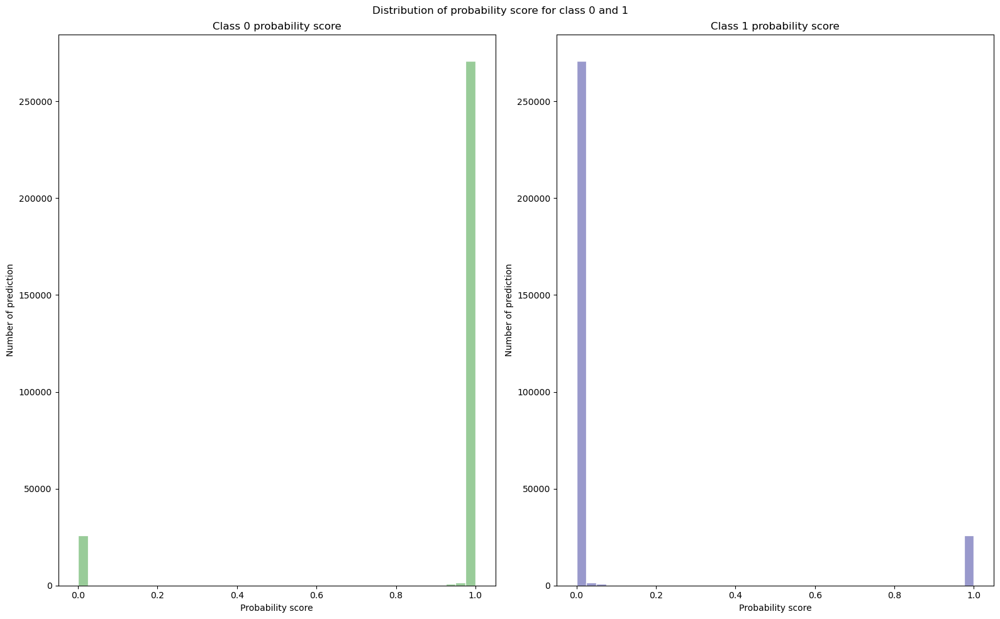

In [24]:
plot_confidence_score_histogram(predicted_probability_rf_rus)

**Observation**: We can see that the probability score is concentrated at either end - either 0 or 1 - with very little in between (if you take close look, you can see tiny bars to the left of 1.0 in the first subplot and to the right of 0.0 in the second subplot). This indicates that the model is extremely confident in predicting whether the transactions is fraud or not - it either is a complete False (0%) or True (100%). We can confirm this with the average confidence score of 99.87%.

The distribution also reflects the majority of the transaction is non-fraudulent as the 0.0 bar for class 0 prediction (i.e., it's 0% confident the transaction is non-fraudulent) have much less count/frequency than the 1.0 bar (i.e., it's 100% confident the transaction is non-fradulent). The class 1 prediction bar chart is a complement of the class 0 prediction bar chart, and it essentially confirms the same idea that the fraudlent transaction is the minority class.

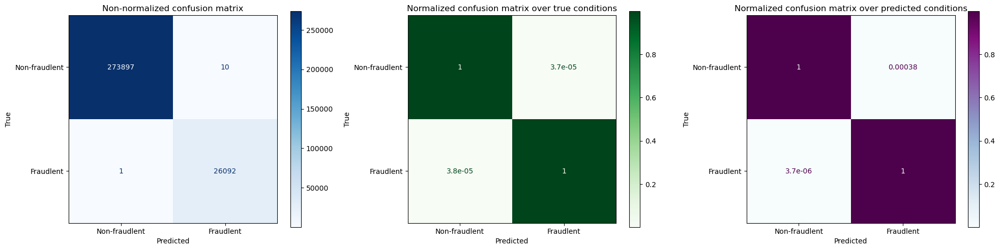

In [25]:
plot_confusion_matrix(y_test, predicted_rf_rus)

**Observation**: We wanted to capture as many positives (i.e., fraudulent transaction) as possible, implying that we need to maximize recall. Ideally, we would also wanted to do this whilst minimize false positives, thereby increase precision, as poor service and customer experience are the main reasons for bank customer churn. Usually, this is captured by the f1 score, but if we have a precision-recall trade-off, we need to prioritize recall because we need to prevent fraudlent transactions going undetected.

1. Precision = TP/(TP + FP) - true positives vs. predicted positives
2. Recall = TP/(TP + FN) - true positives vs. actual positives

If we want to examine precision, we'll look a the third confusion matrix, which normalized the value over the predicted conditions (since precision is the ratio of true postiives vs predicted positives). We can see the ratio is $0.00038$, which is extremely small.

If we want to examine recall, we'll look at the second confusion matrix, which normalized the value over the true/actual conditions (since recall is the ratio of true postives to actual positives). We can see that the ratio is $3.8 \times {10^{−5}}$, even smaller than precision. 

### Model explainability and interpretability

#### Global explanation

SHAP, which stands for SHapley Additive exPlanations, is a way to calculate the impact of a feature to the value of the target variable (i.e., the weight of each feature). These weights do not rely only on the single feature, but on the entire set of features in the dataset. This allows us to explain the model as a whole more comprehensively.

In [26]:
# Fits the explainer
explainer_rus_shap = shap.Explainer(rf_rus.predict, X_test)

In [27]:
# Evaluate SHAP values - this will take times (~ 35-40 mins for 30,000 rows)
shap_values_rus = explainer_rus_shap(X_test[0:30000]) 

Exact explainer: 30001it [1:08:34,  7.29it/s]                           


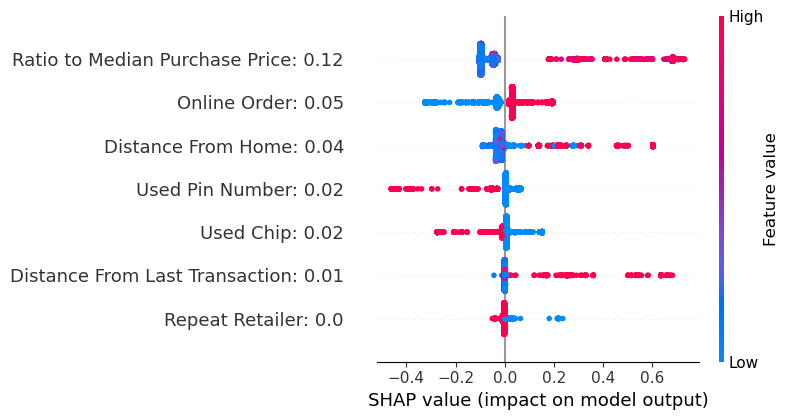

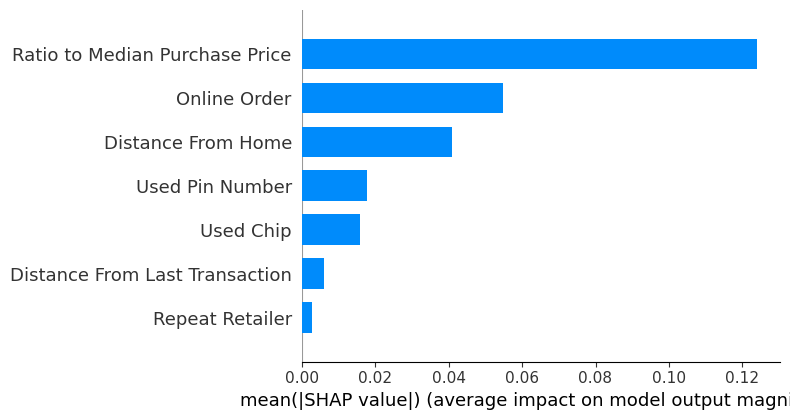

In [28]:
plot_SHAP(shap_values_rus)

**Interpretation**: For the summary plot

1. The y-axis indicates the variable name, in order of importance from top to bottom. The value next to them is the mean SHAP value (not included in Python by default)
2. The x-axis is the SHAP value, which informs us how they feature correlated with the SHAP value. Positive SHAP value means positive impact, leading the model to predict 1 (fraudlent transactions), and vice versa.

For the Mean SHAP plot

1. For each feature, we take the mean of the absolute values as we do not want positive and negative values to offset each other
2. Features that have made large positive/negative contributions will have a large mean SHAP (absolute) value (i.e., the features have a significant impact on the model’s predictions). Therefore, this plot can be used in the same way as a feature importance plot.


Using this information, we can see that `Ratio to Median Purchase Price`, `Online Order`, and `Distance From Home` are the 3 most influential features in determining outcome. More specifically, higher purchase price (compared to median purchase), ordering online, and longer transaction distance from home, which are associated with higher positive SHAP values, increase the likelihood the transaction is fraudulent, and vice versa.

However, keep in mind that we only run 30,000 rows due to time constraints, which is 10% of the test data, to get a quicker result return (the entire training dataset would take approximately 6-7 hours to run). Therefore, this might not be the best overview of the impact of each features, but it has provided us with a few important information.

#### Local explanation

LIME, which stands for Local Interpretable Model-agnostic Explanations, helps explain the model by approximating it locally. It modifies a single data sample by tweaking the feature values and observes the resulting impact on the output.

While global importance shows an average effect across the whole data set, a local-level observation may be influenced in different ways from each variable

In [29]:
y_test.head(10)

157105    1.0
374554    0.0
688694    0.0
265381    0.0
955415    1.0
4280      0.0
514674    0.0
800352    0.0
94727     1.0
753889    0.0
Name: Fraud, dtype: float64

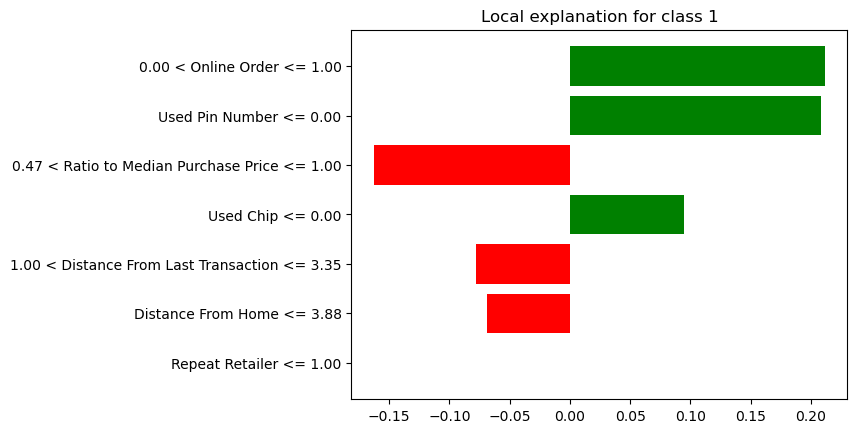

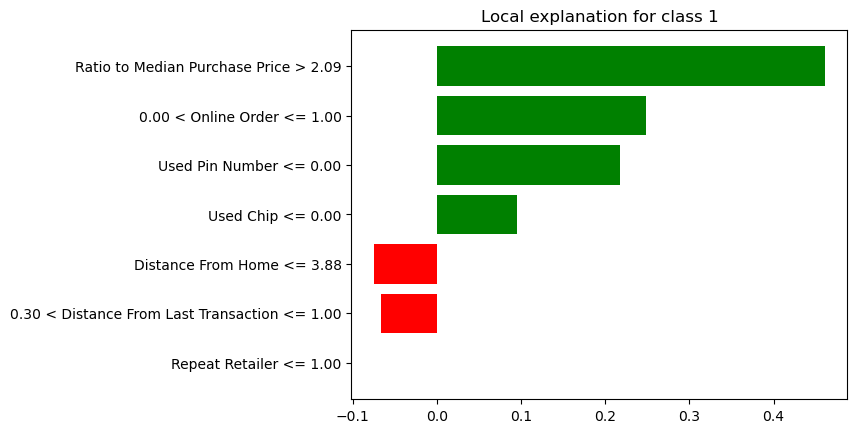

In [30]:
plot_LIME(X_train, X, X_test, 1, rf_rus)   # Non-fraudulent instance
plot_LIME(X_train, X, X_test, 8, rf_rus)   # Fraudulent instance

**Interpretation**: To begin with, the LIME table is not able to be displayed on Github. Now, returning to the LIME plot

1. The table show the feature and the value of the feature for a row
2. The orange and blue, or green and red, indicate positive and negative correlations, respectively. In other words, the orange/green bar (positive) increase probability the prediction is 1 (fraudulent), while the blue/red bar (negative) increase probability the prediction is 0 (non-fraudulent)
3. The length of the bar indicates their relative importance (i.e., the longer the bar, the more positive/negative impact the feature has on the prediction)
4. The condition on the vertical axis is true for the feature's value of that instance. For example: 
    - For the non-fraudulent instance, `Online Order = 1.0`, corresponding to the condition `0.0 < Online Order <= 1.0`, or `Ratio to Median Purchase Price = 0.73`, corresponding to the condition `0.47 < Ratio to Median Purchase Price <= 1.00`.
    - For the fraudulent instance, `used_pin_number = 0.0`, corresponding to the condition `used_pin_number <= 0.00`, or `Distance From Home = 3.82`, corresponding to the condition `Distance From Home <= 3.88`
    - I'm only selecting two random features from each instance. The condition is true for ALL feature's value of that specific instance


Using these information, we can see that 

   - **Non-fraudulent instance**: The prediction is 100% confident it's non-fraudulent. `Online Order`, `Used Pin Number`, and `Ratio to Median Purchase Price` are the top 3 features with most impact. The values of the `Online Order` and `Used Pin Number` positively correlated with prediction of 1, thereby increases the probability the transaction is fraud, whereas the value of `Ratio to Median Purchase Price` is the opposite.
   - **Fraudlent instance**: The prediction is 100% confident it's fraudulent. `Ratio to Median Purchase Price`, `Online Order`, and `Used Pin Number` are the top 3 features with most impact. All of their values positively correlated with prediction of 1, thereby increases the probability the transaction is fraud. The only two features the decrease this probability are `Distance From Home` and `Distance From Last Transaction`.
   
All together, we can see that by ordering online (i.e., `Online Order = 1`), not using a pin number and chip (i.e., `Used Pin Number = 0` and `Used Chip = 0`), having a high amount of transaction compared to the median purchase (`Ratio to Median Purchase Price`), large distance from home (`Distance From Home`) and distance from last transaction (`Distance From Last Transaction`) increase the probability the transaction is fraud, and vice versa. Note that `Repeat Retailer` doesn't correlate with the prediction given it's impact is 0.

## NearMiss undersampling

In [31]:
rf_nearmiss = RandomForestClassifier()
rf_nearmiss.fit(X_train_nearmiss, y_train_nearmiss)
predicted_rf_nearmiss = rf_nearmiss.predict(X_test)
predicted_probability_rf_nearmiss = rf_nearmiss.predict_proba(X_test)
rf_nearmiss_accuracy_score = accuracy_score(predicted_rf_nearmiss, y_test)

In [32]:
model_metrics(rf_nearmiss_accuracy_score, predicted_probability_rf_nearmiss, predicted_rf_nearmiss)

The accuracy score for Random Under Sampling is 0.9999766666666666
The average confidence score of predicting class 0 - the non-fraudulent transactions - is 0.9888970333333333
The average confidence score of predicting class 1 - the fraudulent transactions - is 0.9888970333333333
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00    273907
         1.0       1.00      1.00      1.00     26093

    accuracy                           1.00    300000
   macro avg       1.00      1.00      1.00    300000
weighted avg       1.00      1.00      1.00    300000



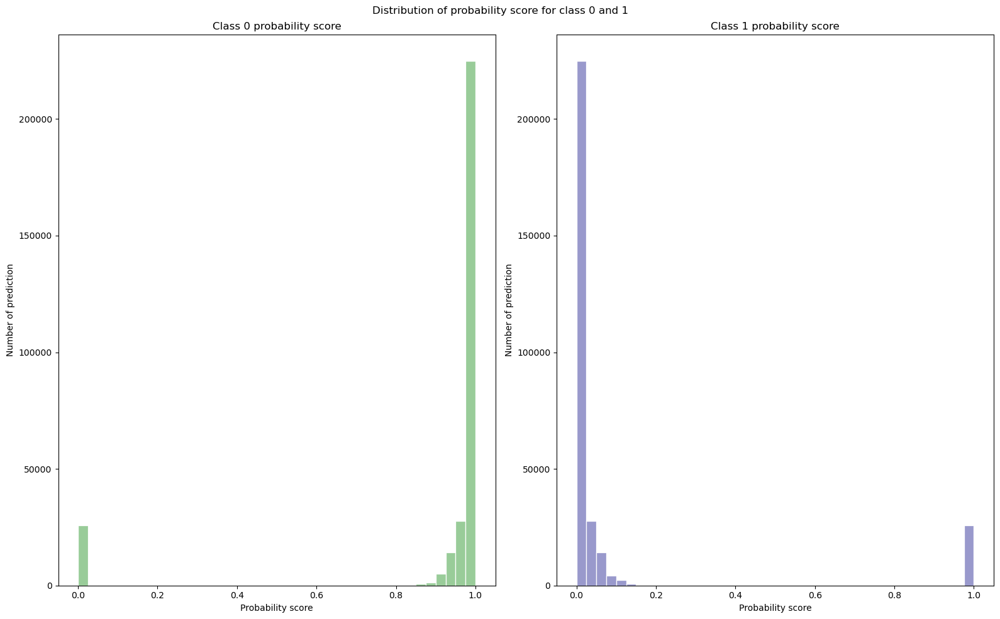

In [33]:
plot_confidence_score_histogram(predicted_probability_rf_nearmiss)

Confidence score is not as high as the first one as we can see more predictions the are not 100% non-fraudulent/0% fraudulent.

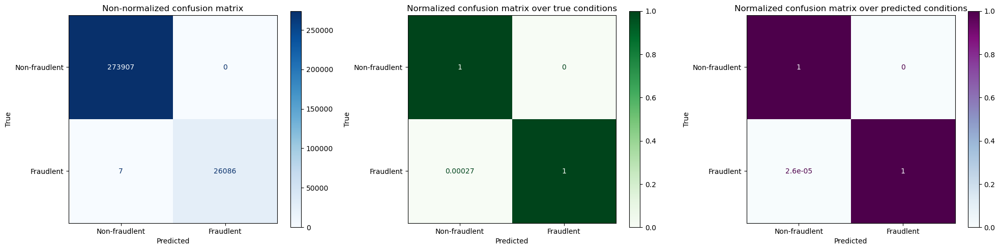

In [34]:
plot_confusion_matrix(y_test, predicted_rf_nearmiss)

High recall but even higher precision (100% precision) as the model have 8 False Negatives (i.e, 0.00031, or 0.031%, of the fraudulent transactions goes undetected) but 0 False Positives

In [35]:
# Fits the explainer
explainer_nearmiss_shap = shap.Explainer(rf_nearmiss.predict, X_test)

In [36]:
# Evaluate SHAP values - this will take times (~ 35-40 mins for 30,000 rows)
shap_values_nearmiss = explainer_nearmiss_shap(X_test[0:30000]) 

Exact explainer: 30001it [39:01, 12.76it/s]                           


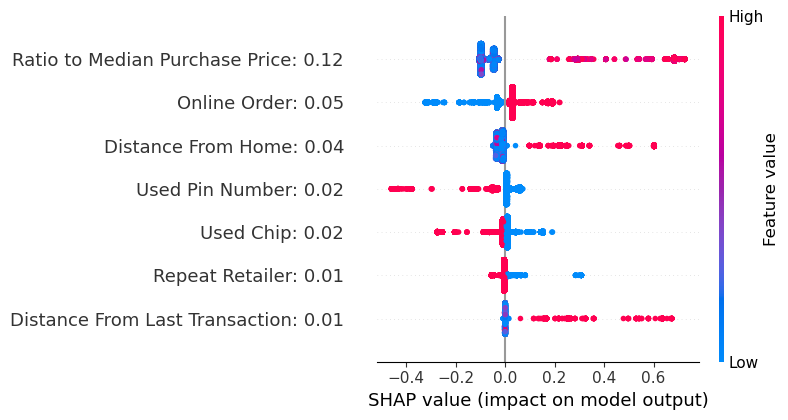

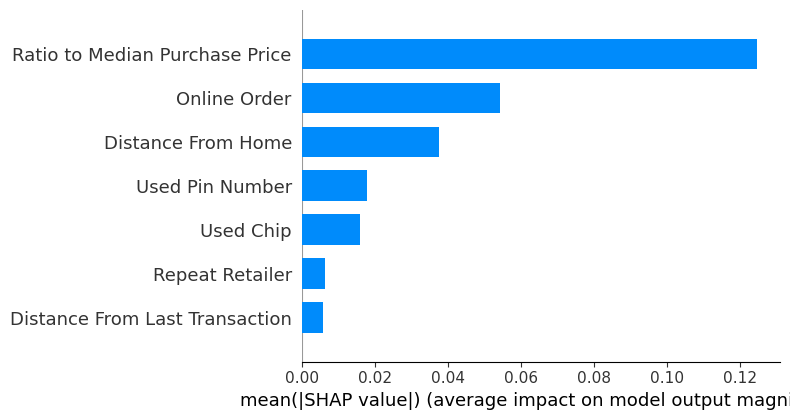

In [37]:
plot_SHAP(shap_values_nearmiss)

Minor increase in `Repeat Retailer` weight, but nothing statistically significant

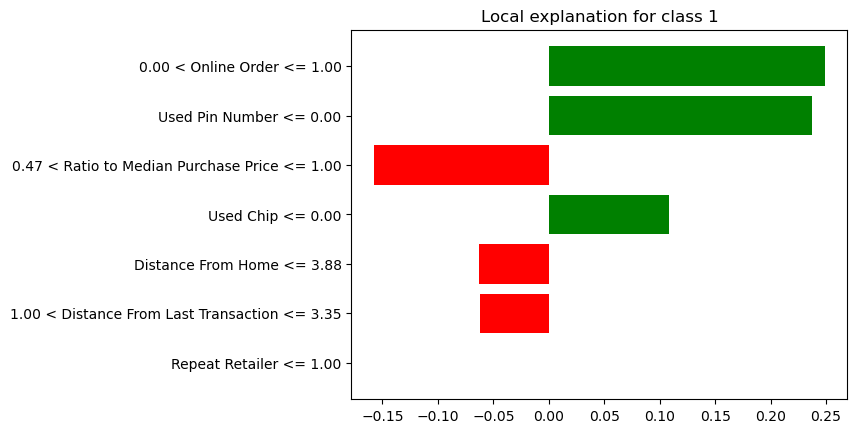

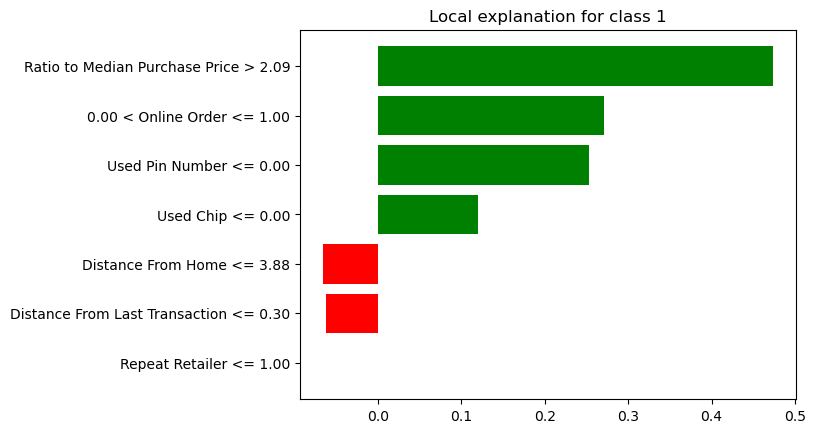

In [38]:
plot_LIME(X_train, X, X_test, 2, rf_nearmiss)   # Non-fraudulent instance
plot_LIME(X_train, X, X_test, 0, rf_nearmiss)   # Fraudulent instance

**Insight**: This time, we'll take a look at a different instances

- **Non-fraudulent instance**: The prediction is 94% confident it's non-fraudulent. `Online Order`, `Used Pin Number`, and `Ratio to Median Purchase Price` are the top 3 features with most impact. The values of the `Online Order` and `Used Pin Number` positively correlated with prediction of 1, thereby increases the probability the transaction is fraud, whereas the value of `Ratio to Median Purchase Price` is the opposite.
- **Fraudlent instance**: The prediction is 100% confident it's fraudulent. `Ratio to Median Purchase Price`, `Online Order`, and `Used Pin Number` are the top 3 features with most impact. All of their values positively correlated with prediction of 1, thereby increases the probability the transaction is fraud. The only two features the decrease this probability are `Distance From Home` and `Distance From Last Transaction`.
   
All together, we can see that the same pattern repeated.

## Random oversampling

In [39]:
rf_ros = RandomForestClassifier()
rf_ros.fit(X_train_ros, y_train_ros)
predicted_rf_ros = rf_ros.predict(X_test)
predicted_probability_rf_ros = rf_ros.predict_proba(X_test)
rf_ros_accuracy_score = accuracy_score(predicted_rf_ros, y_test)

In [40]:
model_metrics(rf_ros_accuracy_score, predicted_probability_rf_ros, predicted_rf_ros)

The accuracy score for Random Under Sampling is 0.9999933333333333
The average confidence score of predicting class 0 - the non-fraudulent transactions - is 0.9998011
The average confidence score of predicting class 1 - the fraudulent transactions - is 0.9998011
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00    273907
         1.0       1.00      1.00      1.00     26093

    accuracy                           1.00    300000
   macro avg       1.00      1.00      1.00    300000
weighted avg       1.00      1.00      1.00    300000



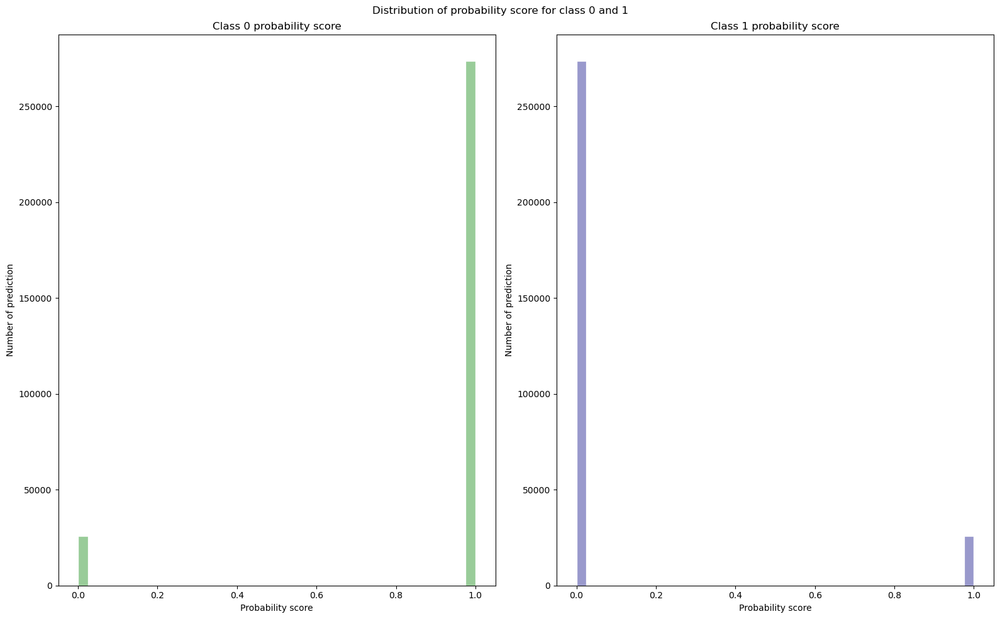

In [41]:
plot_confidence_score_histogram(predicted_probability_rf_ros)

Almost 100% confidence score as we don't see any in between confidence score

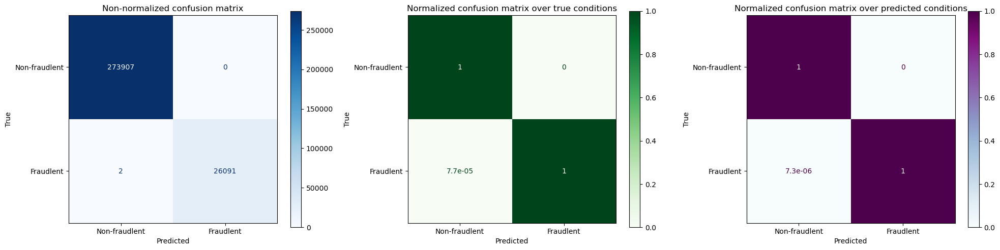

In [42]:
plot_confusion_matrix(y_test, predicted_rf_ros)

Again, high recall - better than the second model - but even higher precision (100% precision) as the model have 3 False Negatives (i.e, 0.00011, or 0.011%, of the fraudulent transactions goes undetected) but 0 False Positives

In [43]:
# Fits the explainer
explainer_ros_shap = shap.Explainer(rf_ros.predict, X_test)

In [44]:
# Evaluate SHAP values - this will take times (~ 35-40 mins for 30,000 rows)
shap_values_ros = explainer_ros_shap(X_test[0:30000]) 

Exact explainer: 30001it [37:14, 13.36it/s]                           


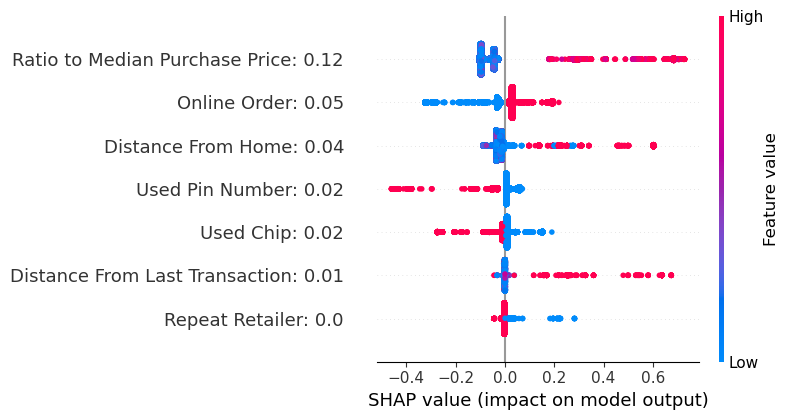

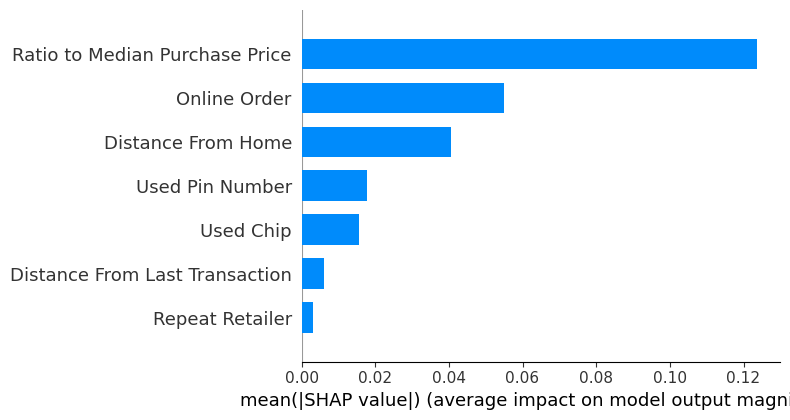

In [45]:
plot_SHAP(shap_values_ros)

Same pattern as the first one

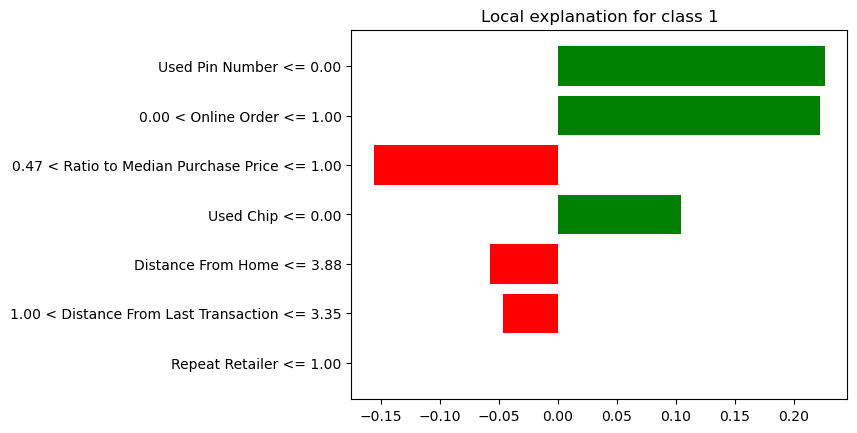

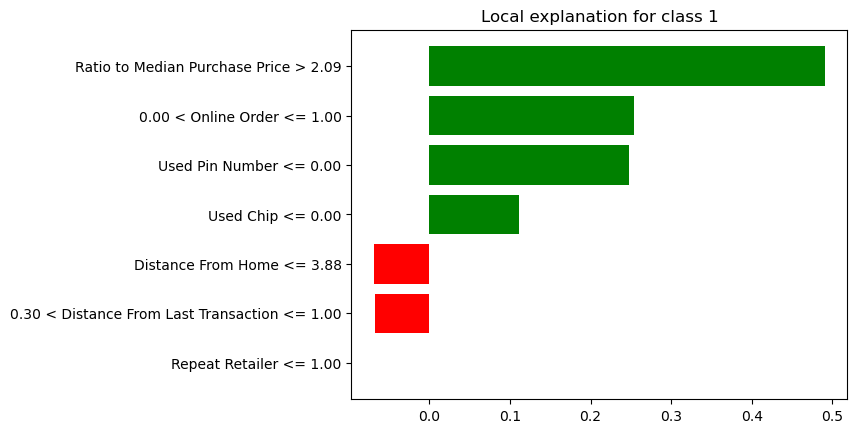

In [46]:
plot_LIME(X_train, X, X_test, 1, rf_ros)   # Non-fraudulent instance
plot_LIME(X_train, X, X_test, 8, rf_ros)   # Fraudulent instance

Same instance as the first one with slightly different weights, but overall correlation between features and prediction as well as the features relative importance remains the same(explain)

## Smote Oversampling

In [47]:
rf_smote = RandomForestClassifier()
rf_smote.fit(X_train_smote, y_train_smote)
predicted_rf_smote = rf_smote.predict(X_test)
predicted_probability_rf_smote = rf_smote.predict_proba(X_test)
rf_smote_accuracy_score = accuracy_score(predicted_rf_smote, y_test)

In [48]:
model_metrics(rf_smote_accuracy_score, predicted_probability_rf_smote, predicted_rf_smote)

The accuracy score for Random Under Sampling is 0.9999833333333333
The average confidence score of predicting class 0 - the non-fraudulent transactions - is 0.9997680333333333
The average confidence score of predicting class 1 - the fraudulent transactions - is 0.9997680333333333
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00    273907
         1.0       1.00      1.00      1.00     26093

    accuracy                           1.00    300000
   macro avg       1.00      1.00      1.00    300000
weighted avg       1.00      1.00      1.00    300000



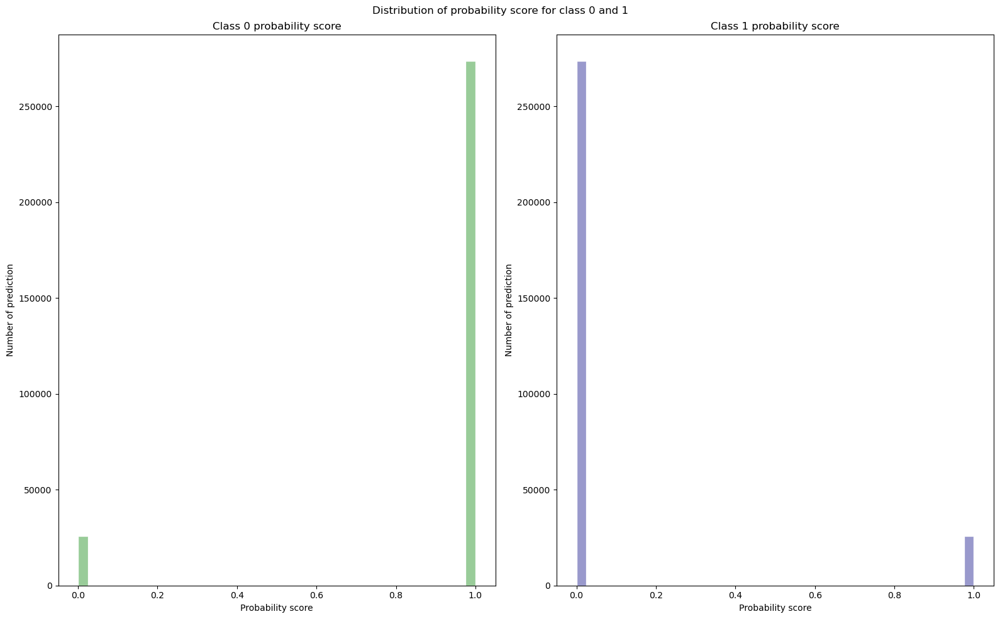

In [49]:
plot_confidence_score_histogram(predicted_probability_rf_smote)

Again, almost 100% confidence score as we don't see any in between confidence score

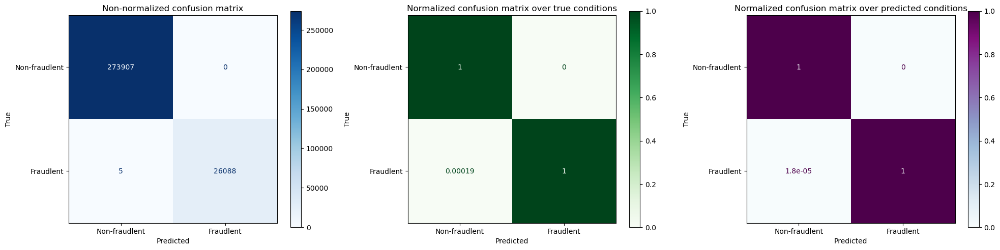

In [50]:
plot_confusion_matrix(y_test, predicted_rf_smote)

Same as the random oversampling model

In [51]:
# Fits the explainer
explainer_smote_shap = shap.Explainer(rf_smote.predict, X_test)

In [52]:
# Evaluate SHAP values - this will take times (~ 35-40 mins for 30,000 rows)
shap_values_smote = explainer_smote_shap(X_test[0:30000]) 

Exact explainer: 30001it [39:28, 12.61it/s]                           


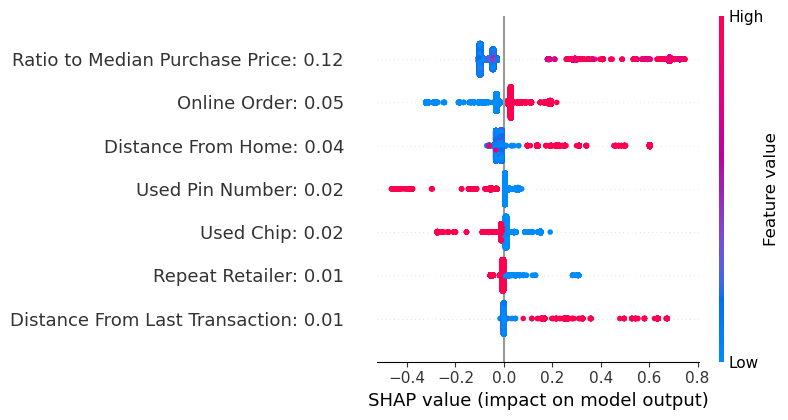

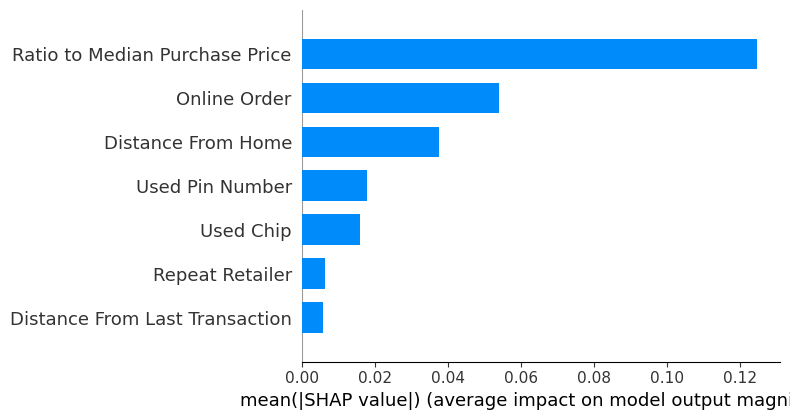

In [53]:
plot_SHAP(shap_values_smote)

Same pattern as the first one

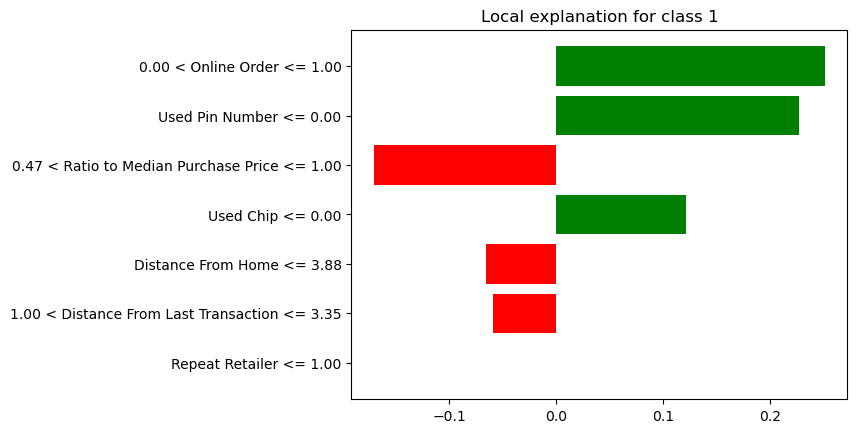

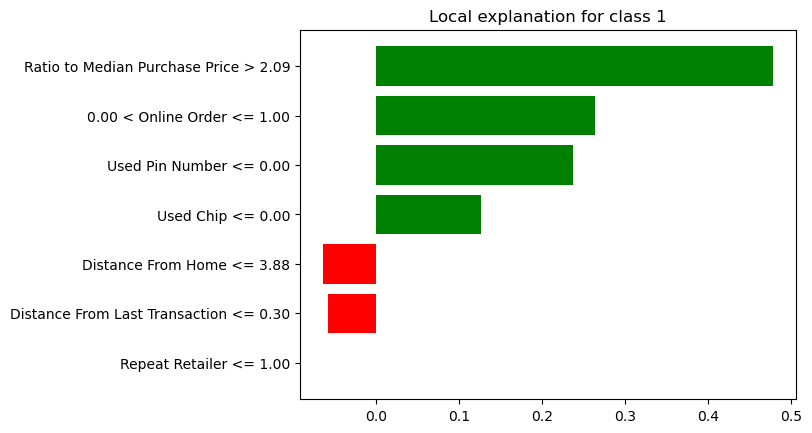

In [54]:
plot_LIME(X_train, X, X_test, 2, rf_nearmiss)   # Non-fraudulent instance
plot_LIME(X_train, X, X_test, 0, rf_nearmiss)   # Fraudulent instance

Same instance as the second one. Again, the model has slightly different weights, but overall correlation between features and prediction as well as the features relative importance remains the same.

## No oversampling/sampling (imbalanced dataset)

In [55]:
rf_imbalanced = RandomForestClassifier()
rf_imbalanced.fit(X_train, y_train)
predicted_rf_imbalanced = rf_imbalanced.predict(X_test)
predicted_probability_rf_imbalanced = rf_imbalanced.predict_proba(X_test)
rf_imbalanced_accuracy_score = accuracy_score(predicted_rf_imbalanced, y_test)

In [56]:
model_metrics(rf_imbalanced_accuracy_score, predicted_probability_rf_imbalanced, predicted_rf_imbalanced)

The accuracy score for Random Under Sampling is 0.9999966666666666
The average confidence score of predicting class 0 - the non-fraudulent transactions - is 0.9997419333333334
The average confidence score of predicting class 1 - the fraudulent transactions - is 0.9997419333333334
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00    273907
         1.0       1.00      1.00      1.00     26093

    accuracy                           1.00    300000
   macro avg       1.00      1.00      1.00    300000
weighted avg       1.00      1.00      1.00    300000



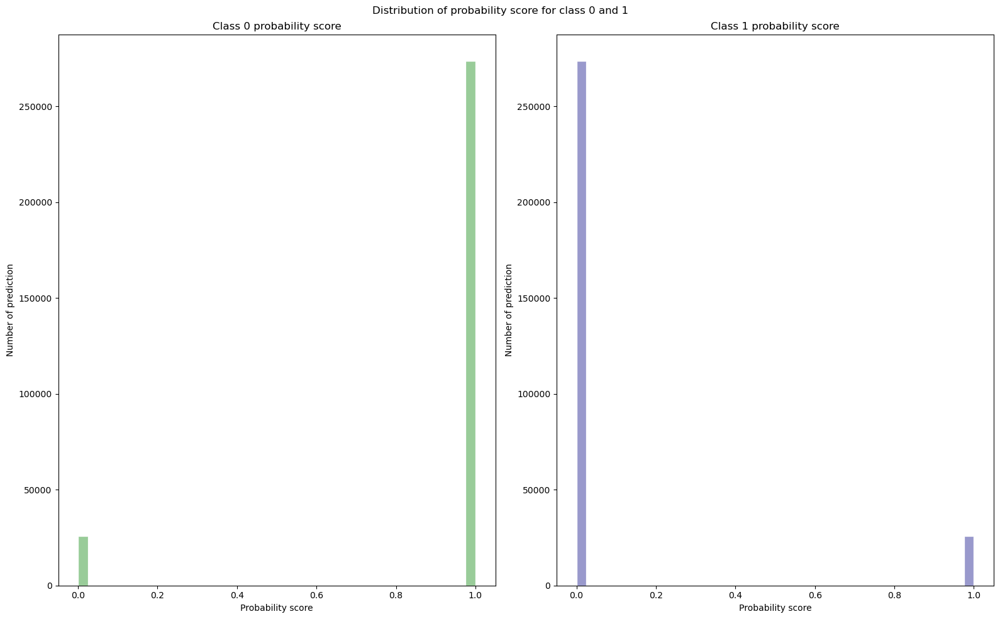

In [57]:
plot_confidence_score_histogram(predicted_probability_rf_imbalanced)

Again, almost 100% confidence score as we don't see any in between confidence score

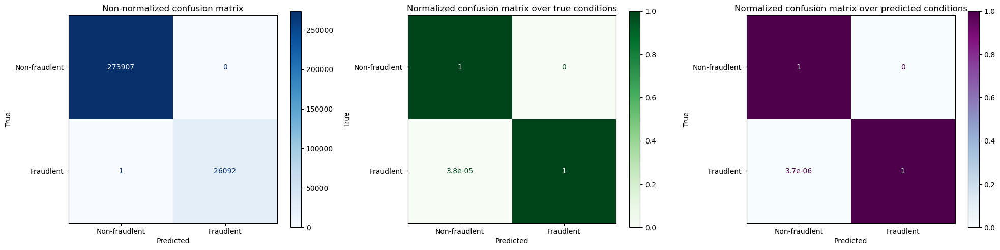

In [58]:
plot_confusion_matrix(y_test, predicted_rf_imbalanced)

Highest recall and precision.

In [59]:
# Fits the explainer
explainer_imbalanced_shap = shap.Explainer(rf_imbalanced.predict, X_test)

In [60]:
# Evaluate SHAP values - this will take times (~ 35-40 mins for 30,000 rows)
shap_values_imbalanced = explainer_imbalanced_shap(X_test[0:30000]) 

Exact explainer: 30001it [37:22, 13.31it/s]                           


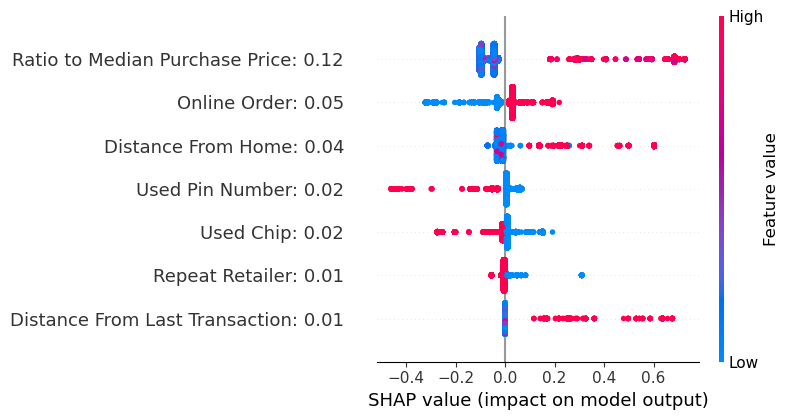

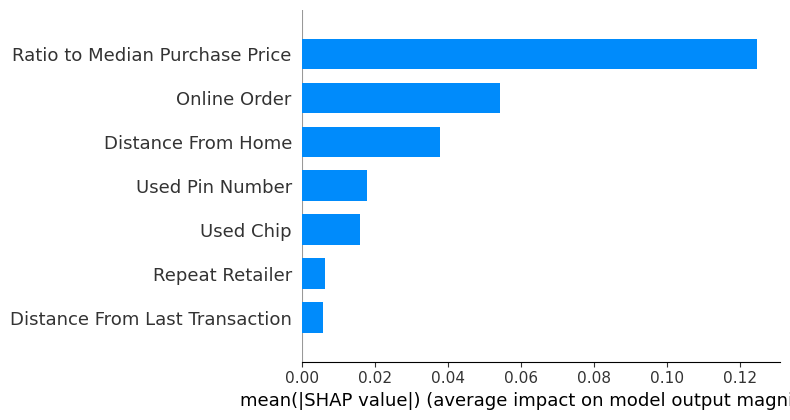

In [61]:
plot_SHAP(shap_values_imbalanced)

Minor increase in `Repeat Retailer` weight, but nothing statistically significant

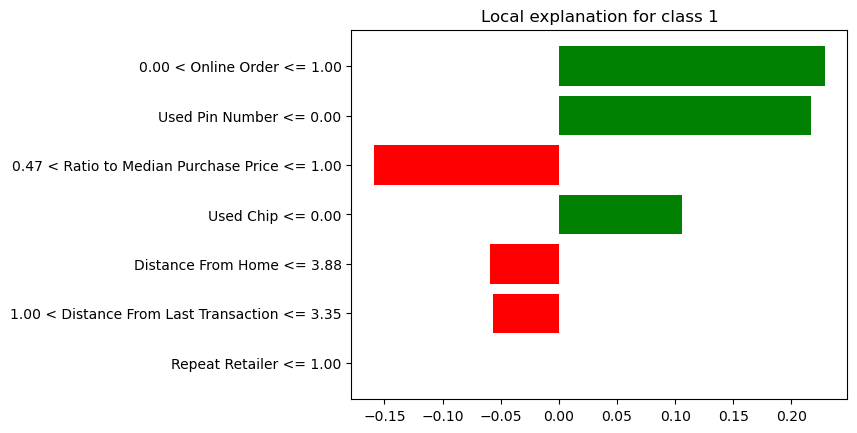

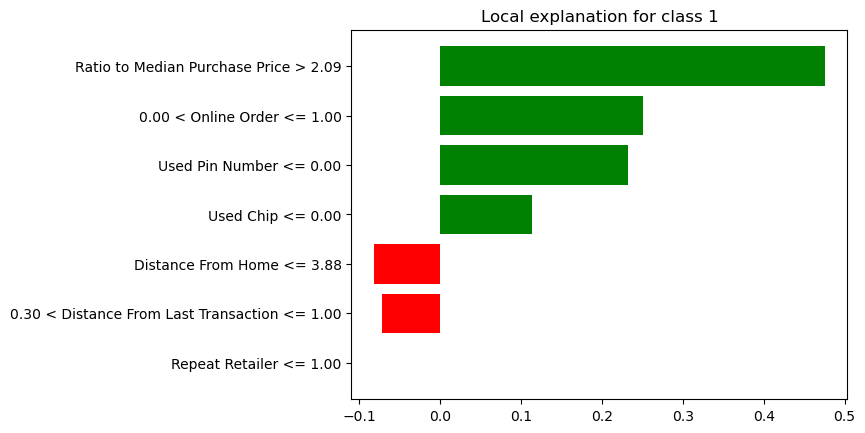

In [62]:
plot_LIME(X_train, X, X_test, 1, rf_imbalanced)   # Non-fraudulent instance
plot_LIME(X_train, X, X_test, 8, rf_imbalanced)   # Fraudulent instance

Same instance as the first one. Again, the model has slightly different weights, but overall correlation between features and prediction as well as the features relative importance remains the same.

# Insight

With all the information presented, we can see that

1. **Model**: Random Forest is an extremely effective model since all metrics are 1.00 (rounded to 2 d.p.). If we prioritze recall, the model that is trained by Random Undersampling is our best choice. However, if we want a balance between Precision and Recall (i.e., highest f1-score), the model that is trained by either Random Oversampling would be more suitable. However, the best performing model is in fact the one without any undersampling or oversampling. The poorest performing model would be the one trained by NearMiss Undersampling, which results in the lowest accuracy, have a relatively lower average confidence score, and a lower recall. This can be attributed to the initial sampling, where due to algorithmic limitation, the two classes remain imbalanced.
2. **How sampling affect the model performance**: Even though the sampling methods helped to deal with an imbalanced dataset, the metrics indicate that the model trained on the imbalanced dataset doesn't differ much from those that are trained on balanced datasets. That being said, the sampling methods helped to improve the model's recall (Random Undersampling) as well as f1-score (Random Oversampling and SMOTE Oversampling)
3. **Feature impact and importance**: We can break this down into two categories 
    - For non-fraudulent transactions, `Online Order`, `Used Pin Number`, and `Ratio to Median Purchase Price` are the top 3 features with most impact 
    - For fraudulent transactions, `Ratio to Median Purchase Price`, `Online Order`, and `Used Pin Number` are the top 3 features with most impact. The features remain the same but the order/importance change

Overall, ordering online (i.e., `Online Order = 1`), not using a pin number and chip (i.e., `Used Pin Number = 0` and `Used Chip = 0`), having a high amount of transaction compared to the median purchase (`Ratio to Median Purchase Price`), large distance from home (`Distance From Home`) and distance from last transaction (`Distance From Last Transaction`) increase the probability the transaction is fraud, while `Repeat Retailer` doesn't affect the prediction. 

These information are intuitive, given that a fraud transaction is likely done somewhere far away, online, and not using a pin number and chip, and the fraudster(s) is trying to steal a large amount of money.

4. **Limitation**: Firstly, NearMiss Undersampling didn't generate a balanced dataset, preventing us to perform a comparative overview of different sampling methods. Secondly, we're only able to run the SHAP for the entire training dataset as it would take 6-7 hours for each run. Therefore, we're only able to interpret the model using 10% of the training dataset. Thirdly, the amount of features (7) is quite small to determine whether the transaction is fraud or not, given that there're other factors we can consider (e.g., purchase category - healthcare, grocery, travel)

### Save the best model

In [ ]:
# Storing
try:
    import pickle
    
except:
    !pip install pickle
    import pickle

    
best_classifer = insert_your_classifer_here

file_to_write = open("random_forest_credit_card_fraud_detection_best_model.saved","wb")
pickle.dump(best_classifer,file_to_write)
file_to_write.close()